# Data Augumentation to address overfitting

In [1]:
!pip install pillow

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import cv2 as cv
import os
import PIL

**Loading Flowers dataset**

In [12]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url,  cache_dir='D:\programming languages\datasets\Flowers dataset', untar=True)
# cache_dir indicates where to download data. I specified . which means current directory
# untar true will unzip it

228813984/228813984 [==============================] - 55s 0us/step


In [13]:
data_dir

'D:\\programming languages\\datasets\\Flowers dataset\\datasets\\flower_photos'

In [19]:
import pathlib
#pathlib is used so that access the file paths directly
data_dir=pathlib.Path(data_dir)
data_dir

WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos')

In [20]:
list(data_dir.glob('*/*.jpg'))[:5]

[WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/daisy/100080576_f52e8ee070_n.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/daisy/10140303196_b88d3d6cec.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/daisy/10172379554_b296050f82_n.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/daisy/10172567486_2748826a8b.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/daisy/10172636503_21bededa75_n.jpg')]

In [22]:
image_count = len(list(data_dir.glob('*/*.jpg')))
image_count

3670

In [31]:
roses=list(data_dir.glob('roses/*'))
roses[:5]

[WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/10090824183_d02c613f10_m.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/102501987_3cdb8e5394_n.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/10503217854_e66a804309.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/10894627425_ec76bbc757_n.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/110472418_87b6a3aa98_m.jpg')]

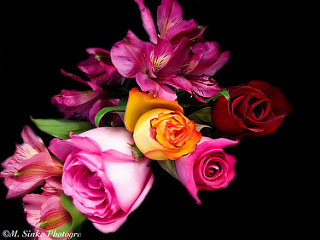

In [35]:
PIL.Image.open(roses[6])

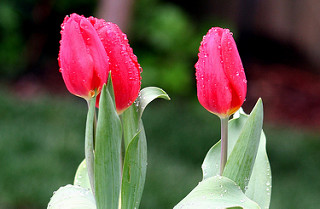

In [36]:
tulips = list(data_dir.glob('tulips/*'))
PIL.Image.open(str(tulips[0]))

**Read flowers images from disk into numpy array using opencv**

In [38]:
flowers_images_dict = {
    'roses': list(data_dir.glob('roses/*')),
    'daisy': list(data_dir.glob('daisy/*')),
    'dandelion': list(data_dir.glob('dandelion/*')),
    'sunflowers': list(data_dir.glob('sunflowers/*')),
    'tulips': list(data_dir.glob('tulips/*')),
}

In [42]:
flowers_labels_dict = {
    'roses': 0,
    'daisy': 1,
    'dandelion': 2,
    'sunflowers': 3,
    'tulips': 4,
}

In [45]:
flowers_images_dict['roses'][0]

WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/10090824183_d02c613f10_m.jpg')

In [46]:
str(flowers_images_dict['roses'][0])

'D:\\programming languages\\datasets\\Flowers dataset\\datasets\\flower_photos\\roses\\10090824183_d02c613f10_m.jpg'

In [44]:
x_list,y_list=[],[]
for flower_name,flower_paths in flowers_images_dict.items():
    for image_path in flower_paths:
        img=cv.imread(str(image_path))
        resized_img=cv.resize(img,(180,180))
        x_list.append(resized_img)
        y_list.append(flowers_labels_dict[flower_name])

In [47]:
x_list

[array([[[ 1, 16,  7],
         [ 1, 16,  7],
         [ 1, 17,  9],
         ...,
         [23, 50, 31],
         [25, 51, 32],
         [26, 52, 33]],
 
        [[10, 23, 15],
         [10, 23, 15],
         [ 9, 22, 14],
         ...,
         [20, 44, 30],
         [23, 47, 33],
         [26, 50, 36]],
 
        [[13, 20, 13],
         [12, 20, 13],
         [11, 19, 12],
         ...,
         [21, 43, 30],
         [22, 45, 31],
         [25, 48, 34]],
 
        ...,
 
        [[12, 24, 18],
         [11, 22, 15],
         [12, 21, 11],
         ...,
         [ 7, 14,  7],
         [ 2,  8,  2],
         [ 0,  2,  0]],
 
        [[19, 30, 28],
         [16, 26, 21],
         [14, 22, 15],
         ...,
         [ 3, 12,  2],
         [ 0,  8,  1],
         [ 0,  6,  1]],
 
        [[11, 21, 20],
         [17, 25, 24],
         [21, 28, 23],
         ...,
         [ 1, 12,  2],
         [ 2, 10,  3],
         [ 3, 10,  4]]], dtype=uint8),
 array([[[13, 18, 17],
         [11, 13, 1

In [48]:
y_list

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [49]:
x=np.array(x_list)
x.shape

(3670, 180, 180, 3)

In [51]:
y=np.array(y_list)
y

array([0, 0, 0, ..., 4, 4, 4])

**Train Test Split**

In [52]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

**Preprocessing: scaling images**

In [54]:
x_train_scaled = x_train / 255
x_test_scaled = x_test / 255

**Build convolutional neural network and train it**

In [58]:
model=keras.Sequential([
    keras.layers.Conv2D(filters=16,kernel_size=(3,3),padding='same',activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(filters=63,kernel_size=(3,3),padding='same',activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Flatten(),
    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(5)#default activation='linear'
])
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(x_train_scaled, y_train, epochs=1)#it needs to be run for atleast 30 epochs

86/86 [==============================] - 107s 1s/step - loss: 1.4119 - accuracy: 0.4099


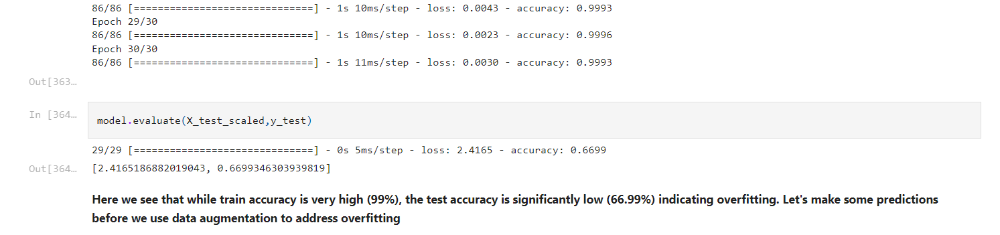

In [77]:
predictions=model.predict(x_test_scaled)
predictions[0]
#here values are not in the range of 0 to 1 and hence softmax function is used to convert them

29/29 [==============================] - 6s 202ms/step


array([-0.2787235 ,  1.5850174 ,  1.2979077 , -2.6788657 , -0.48183692],
      dtype=float32)

In [78]:
np.argmax(predictions[0])

1

In [79]:
scores=tf.nn.softmax(predictions)
scores[0]

<tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.07579587, 0.48871756, 0.366748  , 0.00687507, 0.06186349],
      dtype=float32)>

In [80]:
np.argmax(scores[0])

1

**Improve Test Accuracy Using Data Augmentation**

In [100]:
data_augmentation = keras.Sequential(
  [
    keras.layers.experimental.preprocessing.RandomFlip("horizontal", input_shape=(180, 180,3)),
    keras.layers.experimental.preprocessing.RandomRotation(0.1),
    keras.layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)

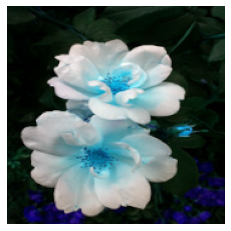

In [101]:
#original image
plt.axis('off')#it is turn of the axis lines
plt.imshow(x[0])

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.ops.tensor_array_ops.TensorArray'>):
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "C:\Users\Sharath chandra\anaconda3\lib\site-packages\tensorflow\python\ops\control_flow_ops.py", line 2789, in while_loop
    return result  File "C:\Users\Sharath chandra\anaconda3\lib\site-packages\tensorflow\python\ops\control_flow_ops.py", line 2745, in <lambda>
    body = lambda i, lv: (i + 1, orig_body(*lv))  File "C:\Users\Sharath chandra\anaconda3\lib\site-packages\tensorflow\python\ops\map_fn.py", line 493, in compute
    return (i + 1, tas)  File "C:\Users\Sharath chandra\anaconda3\lib\site-packages\tensorflow\python\ops\map_fn.py", line 491, in <listcomp>
    ta.write(i, value) for (ta, value) in zip(tas, result_value_batchable)  File "C:\Users\Sharath chandra\anaconda3\lib\site-packages\tensorflow\python\util\tf_should_use.py", line 

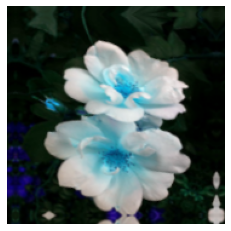

In [103]:
#augumented image
plt.axis('off')
plt.imshow(data_augmentation(x)[0].numpy().astype("uint8"))

**Train the model using data augmentation and a drop out layer**

In [106]:
model = keras.Sequential([
  data_augmentation,
  keras.layers.Conv2D(16, 3, padding='same', activation='relu'),
  keras.layers.MaxPooling2D(),
  keras.layers.Conv2D(32, 3, padding='same', activation='relu'),
  keras.layers.MaxPooling2D(),
  keras.layers.Conv2D(64, 3, padding='same', activation='relu'),
  keras.layers.MaxPooling2D(),
  keras.layers.Dropout(0.2),
  keras.layers.Flatten(),
  keras.layers.Dense(128, activation='relu'),
  keras.layers.Dense(5)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(x_train_scaled, y_train, epochs=1)   

86/86 [==============================] - 84s 921ms/step - loss: 1.3246 - accuracy: 0.4386


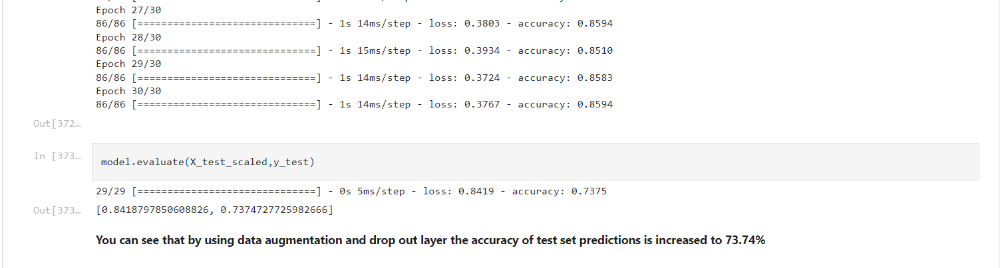

# Transfer Learning for Image classification        
Transfer learning generally refers to a process where a model trained on one problem is used in some way on a second related problem. In deep learning, transfer learning is a technique whereby a neural network model is first trained on a problem similar to the problem that is being solved

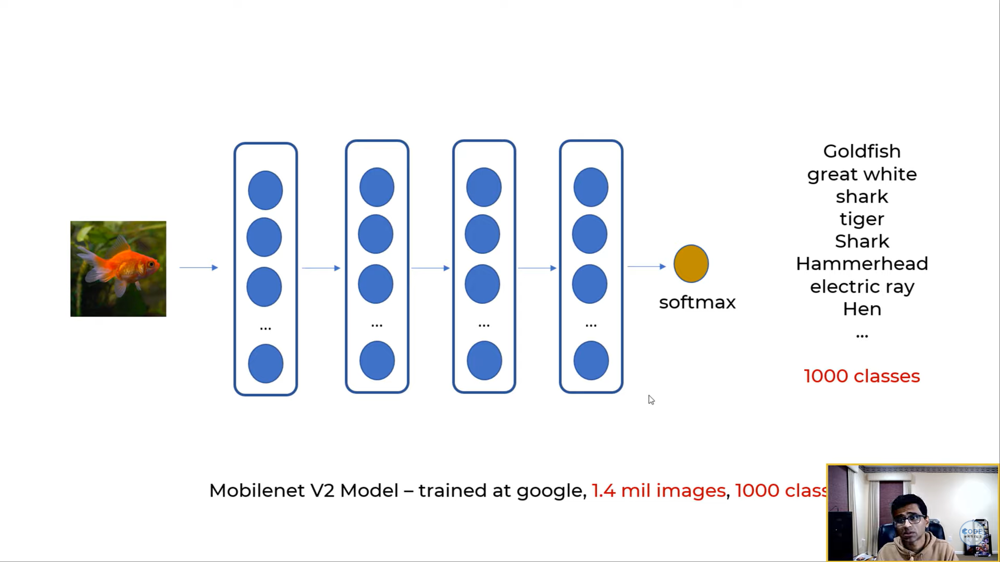

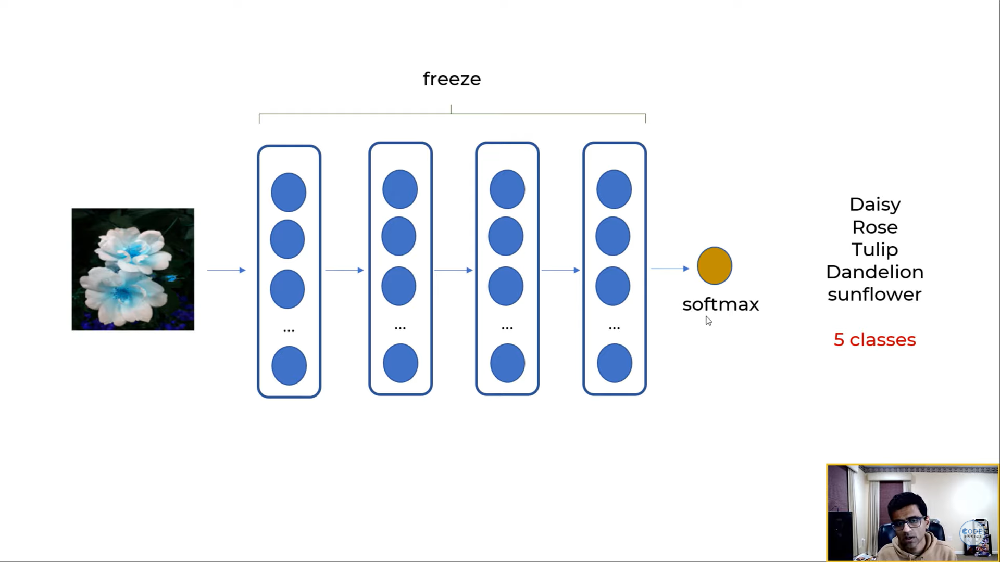
**Only last layer is changed, and remaining layers are freezed and hence computation is decreased**

In [13]:
!pip install tensorflow_hub

In [14]:
import numpy as np
import PIL
import cv2 as cv
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow_hub as hub

In [15]:
#from documentation given that shape of trained images is 224 x 224
IMAGE_SHAPE=(224,224)
classifier=keras.Sequential([
    hub.KerasLayer("https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4",input_shape=IMAGE_SHAPE+(3,))
])

In [18]:
print(IMAGE_SHAPE)
print(IMAGE_SHAPE+(3,))#it will convert single colored image into three colored image

(224, 224)
(224, 224, 3)


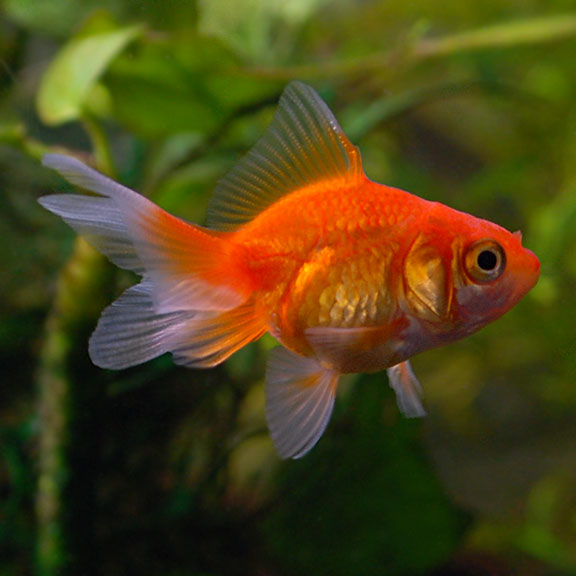

In [71]:
#reading an image
img=PIL.Image.open("D:\programming languages\datasets\samples\goldfish.jpg")
img

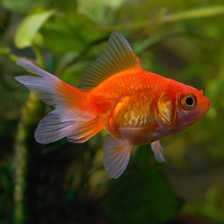

In [72]:
#resizing the image
img=img.resize(IMAGE_SHAPE)
img

In [73]:
img=np.array(img)
img.shape

(224, 224, 3)

In [74]:
#scaling image
img=img/255
img

array([[[0.28235294, 0.33333333, 0.07058824],
        [0.31372549, 0.37254902, 0.09019608],
        [0.34901961, 0.41960784, 0.11764706],
        ...,
        [0.32941176, 0.39215686, 0.00392157],
        [0.32156863, 0.38431373, 0.00392157],
        [0.30980392, 0.36862745, 0.        ]],

       [[0.28627451, 0.33333333, 0.08235294],
        [0.3254902 , 0.38039216, 0.10980392],
        [0.35294118, 0.42352941, 0.12941176],
        ...,
        [0.32156863, 0.38039216, 0.00392157],
        [0.31372549, 0.37254902, 0.00392157],
        [0.30196078, 0.36078431, 0.        ]],

       [[0.28627451, 0.33333333, 0.08627451],
        [0.31372549, 0.36862745, 0.10196078],
        [0.34509804, 0.41568627, 0.12941176],
        ...,
        [0.31764706, 0.37647059, 0.00392157],
        [0.30980392, 0.36862745, 0.00784314],
        [0.29803922, 0.35686275, 0.00392157]],

       ...,

       [[0.05490196, 0.10980392, 0.01568627],
        [0.05098039, 0.11372549, 0.01960784],
        [0.05098039, 0

In [75]:
#model cannot predict for a single value (224,224,3) and hence converting it into (1,224,224,3) format
img=img[np.newaxis,...]
img.shape

(1, 224, 224, 3)

In [81]:
#prediction
result=classifier.predict(img)
result

1/1 [==============================] - 0s 454ms/step


array([[ 0.2210783 ,  2.049765  ,  9.622808  , ..., -1.4619292 ,
        -0.28231034, -0.25916398]], dtype=float32)

In [82]:
#getting the index of the high value i.e output
np.argmax(result)

2

In [85]:
np.argmax(result1)

906

In [86]:
#ImageNetLabels.txt is a file containing 1000 label names of the dataset and reading those labels into a list
image_labels = []
with open("D:\programming languages\datasets\ImageNetLabels.txt", "r") as f:
    image_labels = f.read().splitlines()
image_labels[:5]

['background', 'tench', 'goldfish', 'great white shark', 'tiger shark']

In [87]:
image_labels[2]

'goldfish'

**Loading Flowers dataset**

In [89]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url,  cache_dir='D:\programming languages\datasets\Flowers dataset', untar=True)

In [90]:
data_dir

'D:\\programming languages\\datasets\\Flowers dataset\\datasets\\flower_photos'

In [91]:
import pathlib
data_dir=pathlib.Path(data_dir)
data_dir

WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos')

In [94]:
list(data_dir.glob("roses/*"))[:5]

[WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/10090824183_d02c613f10_m.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/102501987_3cdb8e5394_n.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/10503217854_e66a804309.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/10894627425_ec76bbc757_n.jpg'),
 WindowsPath('D:/programming languages/datasets/Flowers dataset/datasets/flower_photos/roses/110472418_87b6a3aa98_m.jpg')]

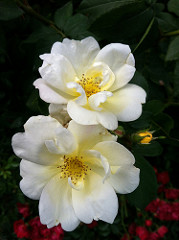

In [97]:
PIL.Image.open(str(list(data_dir.glob('roses/*'))[0]))

**Read flowers images from disk into numpy array using opencv**

In [98]:
flowers_images_dict = {
    'roses': list(data_dir.glob('roses/*')),
    'daisy': list(data_dir.glob('daisy/*')),
    'dandelion': list(data_dir.glob('dandelion/*')),
    'sunflowers': list(data_dir.glob('sunflowers/*')),
    'tulips': list(data_dir.glob('tulips/*')),
}
flowers_labels_dict = {
    'roses': 0,
    'daisy': 1,
    'dandelion': 2,
    'sunflowers': 3,
    'tulips': 4,
}

In [101]:
x, y = [], []

for flower_name, images in flowers_images_dict.items():
    for image in images:
        img = cv.imread(str(image))
        resized_img = cv.resize(img,(224,224))
        x.append(resized_img)
        y.append(flowers_labels_dict[flower_name])

In [102]:
x=np.array(x)
y=np.array(y)

In [104]:
x[0].shape

(224, 224, 3)

In [105]:
y.shape

(3670,)

**Train Test Split**

In [108]:
from sklearn.model_selection import train_test_split

In [118]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)
x_train.shape,y_train.shape

((2936, 224, 224, 3), (2936,))

**Now take pre-trained model and retrain it using flowers images**

In [122]:
feature_extractor_model = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"
#  "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4" -->This is previously used url.
#The difference is in classification we can readily use it, where as for feature_vector we can use it for training our own model
pretrained_model_without_top_layer = hub.KerasLayer(
    feature_extractor_model, input_shape=(224, 224, 3), trainable=False)
#tr

In [123]:
num_of_flowers = 5

model = keras.Sequential([
  pretrained_model_without_top_layer,
  keras.layers.Dense(num_of_flowers)
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 5)                 6405      
                                                                 
Total params: 2,264,389
Trainable params: 6,405
Non-trainable params: 2,257,984
_________________________________________________________________


In [125]:
model.compile(
  optimizer="adam",
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

model.fit(x_train, y_train, epochs=5)

Epoch 1/5
92/92 [==============================] - 82s 802ms/step - loss: 1.4015 - acc: 0.4356
Epoch 2/5
92/92 [==============================] - 74s 801ms/step - loss: 1.1721 - acc: 0.5473
Epoch 3/5
92/92 [==============================] - 73s 794ms/step - loss: 1.0652 - acc: 0.5954
Epoch 4/5
92/92 [==============================] - 73s 795ms/step - loss: 1.0123 - acc: 0.6175
Epoch 5/5
92/92 [==============================] - 73s 793ms/step - loss: 0.9709 - acc: 0.6427


In [126]:
model.evaluate(x_test,y_test)

23/23 [==============================] - 20s 818ms/step - loss: 1.0784 - acc: 0.5668


[1.078449010848999, 0.5667575001716614]

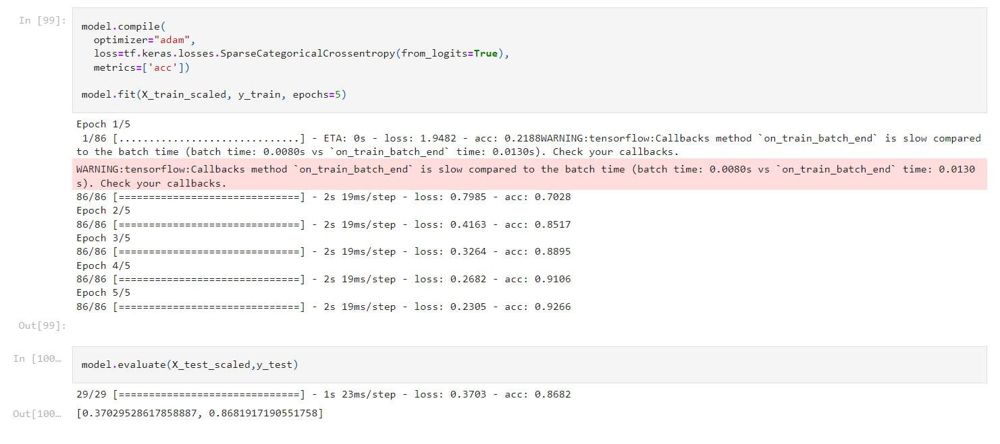

**Since I didn't scale the values , I got less accuracy**

# Sliding object Detection
Sliding window object detection is a technique that allows you to detect objects in a picture. This technique is not very efficient as it is very compute intensive. Recently new techniques has been discovered that tried to improve performance such as R CNN, Fast R CNN, Faster R CNN etc.    
**R CNN** --> regions with convolutional neural networks

# YOLO Algorithm
You Only Look Once    
It is fastest among sliding window,R CNN, Fast R CNN, Faster R CNN

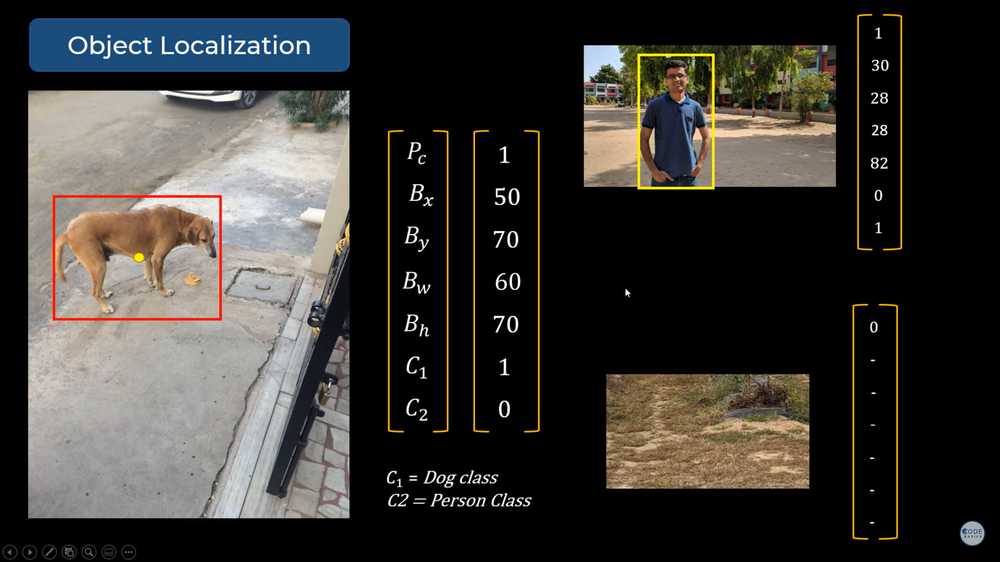

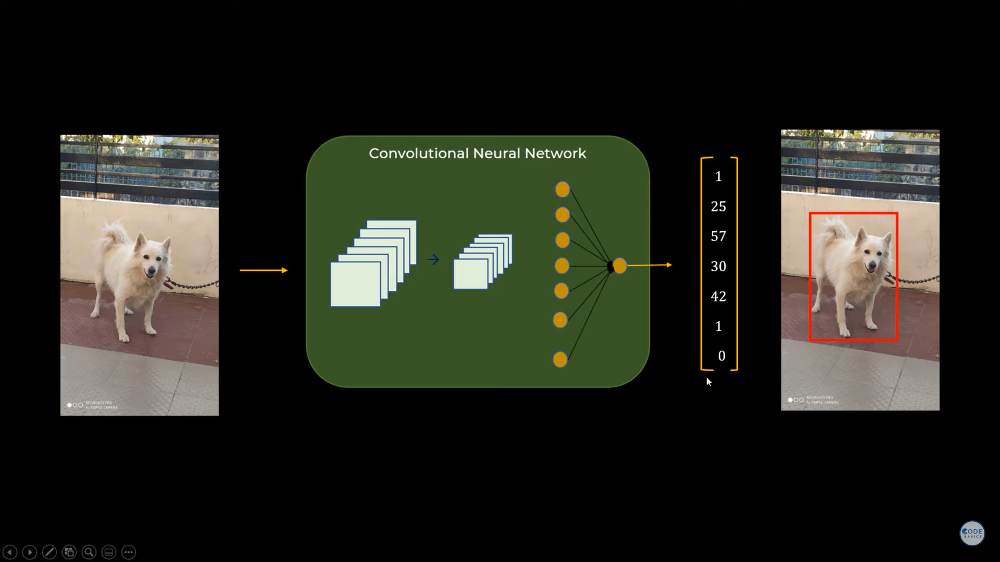

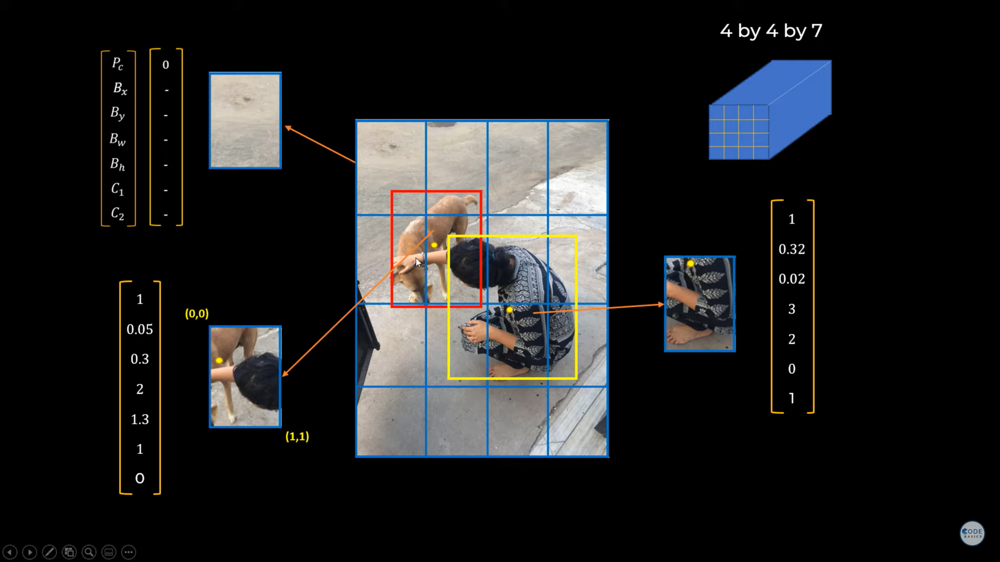

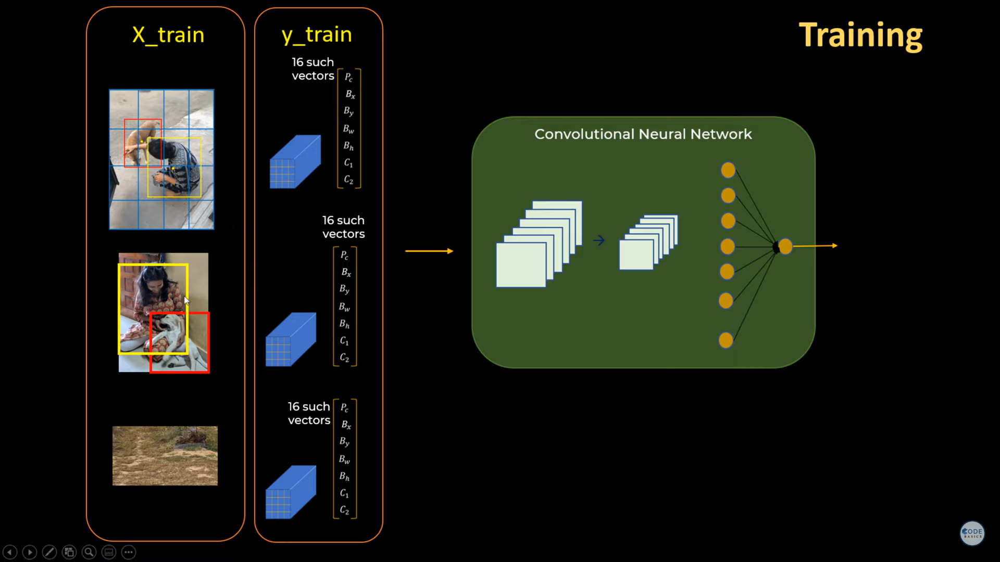

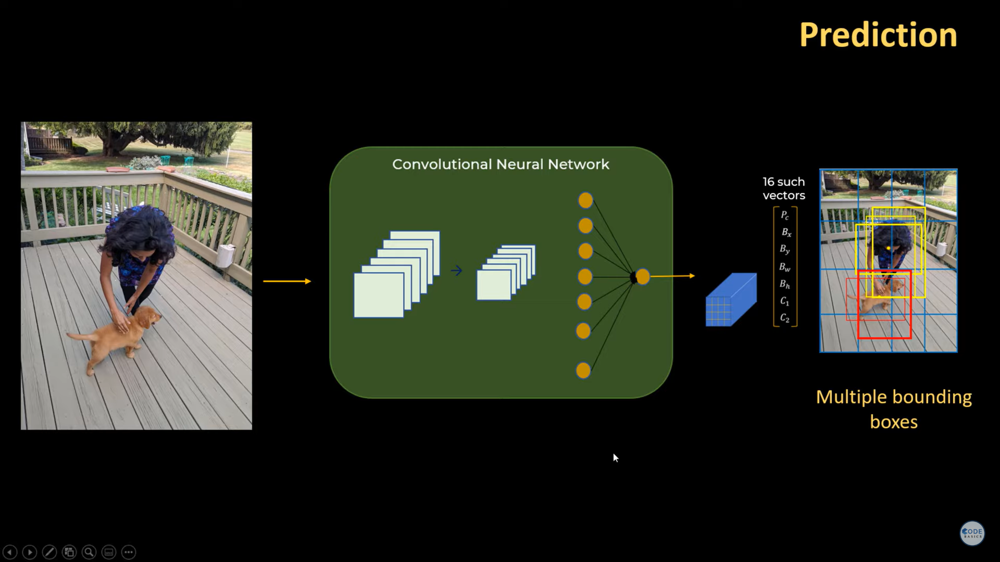

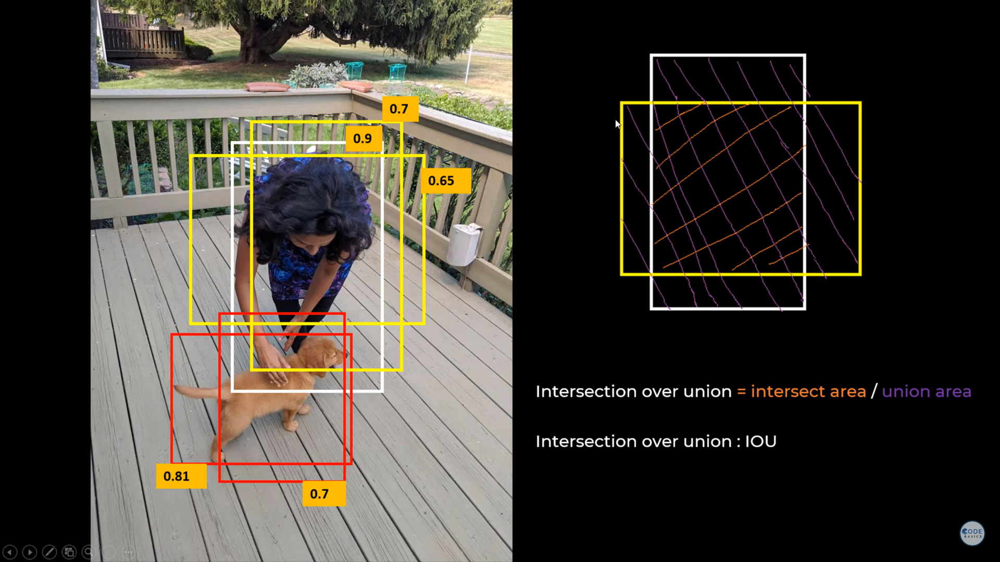
**If IOU > 65% then those rectangles can be removed**

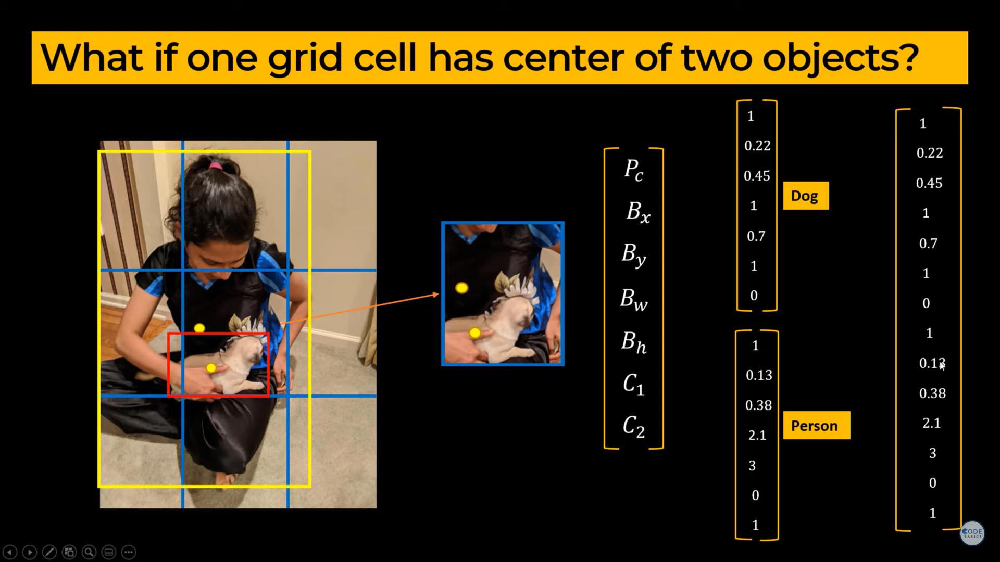